In [ ]:
import numpy as np
import pandas as pd


from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
path = '/content/drive/My Drive/machine learning project'

train_df = pd.read_csv(path + '/train.csv')

train_drop_na = train_df.dropna()

train_drop_na['d - mw'] = train_drop_na['duration'] - train_drop_na['meter_waiting']

train_drop_na['fare_per_second']  = (train_drop_na['fare'] - train_drop_na['additional_fare'] - train_drop_na['meter_waiting_fare']) / train_drop_na['d - mw']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [ ]:

from math import sin, cos, sqrt, atan2

R = 6373.0

def haversine(lat1, lon1, lat2, lon2, to_radians=True, earth_radius=6371):
    """
    slightly modified version: of http://stackoverflow.com/a/29546836/2901002

    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees or in radians)

    All (lat, lon) coordinates must have numeric dtypes and be of equal length.

    """
    if to_radians:
        lat1, lon1, lat2, lon2 = np.radians([lat1, lon1, lat2, lon2])

    a = np.sin((lat2-lat1)/2.0)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin((lon2-lon1)/2.0)**2

    return earth_radius * 2 * np.arcsin(np.sqrt(a))


train_drop_na['distance'] = haversine(train_drop_na['pick_lat'], train_drop_na['pick_lon'], train_drop_na['drop_lat'], train_drop_na['drop_lon'])

train_drop_na['speed'] = (train_drop_na['distance'] / train_drop_na['d - mw'])  * 3600

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
train_drop_na['fare_per_km'] = train_drop_na['fare'] / train_drop_na['distance']


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
train_drop_na['fare_per_km_driving'] = (train_drop_na['fare'] - train_drop_na['additional_fare'] - train_drop_na['meter_waiting_fare']) / train_drop_na['distance']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
from datetime import datetime

pd.to_datetime(train_drop_na['pickup_time'], format="%m/%d/%Y %H:%M")

train_drop_na['time'] = pd.to_datetime(train_drop_na['drop_time'], format="%m/%d/%Y %H:%M") - pd.to_datetime(train_drop_na['pickup_time'], format="%m/%d/%Y %H:%M")

train_drop_na['time'] = train_drop_na['time'].dt.total_seconds()

train_drop_na['time_difference'] = np.abs(train_drop_na['time'] - train_drop_na['duration'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/

In [ ]:
train_drop_na.head()

,tripid,additional_fare,duration,meter_waiting,meter_waiting_fare,meter_waiting_till_pickup,pickup_time,drop_time,pick_lat,pick_lon,drop_lat,drop_lon,fare,label,d - mw,fare_per_second,distance,speed,fare_per_km,fare_per_km_driving,time,time_difference
0,189123628,10.5,834.0,56.0,0.0000,64.0,11/1/2019 0:20,11/1/2019 0:34,6.86252,79.8993,6.90330,79.8783,270.32,correct,778.0,0.333959,5.092770,23.565516,53.079170,51.017424,840.0,6.0
1,189125358,10.5,791.0,47.0,0.0000,134.0,11/1/2019 0:56,11/1/2019 1:09,6.88589,79.8984,6.91373,79.8923,197.85,correct,744.0,0.251815,3.168058,15.329311,62.451516,59.137183,780.0,11.0
2,189125719,10.5,1087.0,80.0,0.0000,61.0,11/1/2019 1:08,11/1/2019 1:26,6.90839,79.8651,6.93669,79.9146,301.64,correct,1007.0,0.289116,6.305395,22.541631,47.838398,46.173157,1080.0,7.0
3,189127273,10.5,598.0,271.0,15.6638,68.0,11/1/2019 2:27,11/1/2019 2:37,6.92570,79.8895,6.92748,79.8971,82.30,correct,327.0,0.171670,0.861946,9.489315,95.481606,65.127273,600.0,2.0
5,189129552,10.5,3407.0,182.0,0.0000,112.0,11/1/2019 5:38,11/1/2019 6:35,7.13402,79.8969,6.91865,79.8649,1065.02,correct,3225.0,0.326983,24.207039,27.021811,43.996293,43.562535,3420.0,13.0


In [ ]:
test = pd.read_csv(path + '/test.csv')

In [ ]:
train_drop_na['driving_fare'] = train_drop_na['fare'] - train_drop_na['additional_fare'] - train_drop_na['meter_waiting_fare'] - 50

train_drop_na['d_per_second'] = train_drop_na['driving_fare'] / train_drop_na['d - mw']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
import matplotlib.pyplot as plt

%matplotlib inline

import seaborn as sns

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


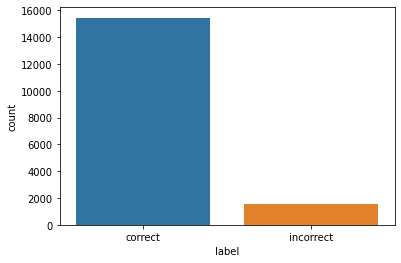

In [ ]:
sns.countplot(x='label', data = train_drop_na)

In [ ]:
t_no_inf = train_drop_na.loc[train_drop_na['fare_per_second'] != np.inf]

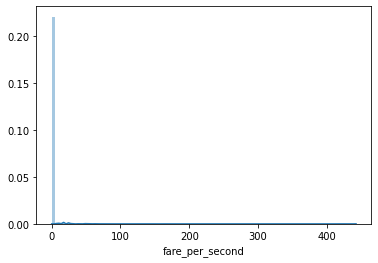

In [ ]:
sns.distplot(t_no_inf['fare_per_second'], bins = 100)

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:193: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:193: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:193: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/lo

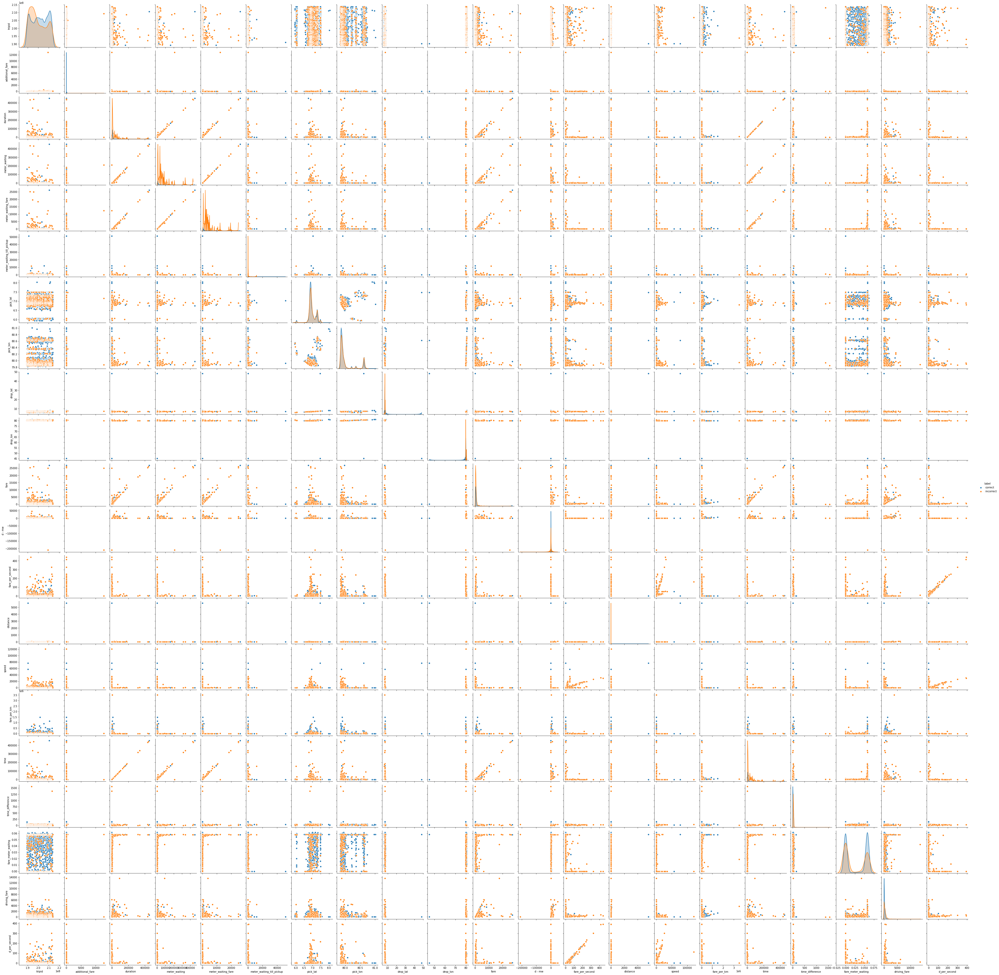

In [ ]:
sns.pairplot(train_drop_na, hue = 'label')

In [ ]:

g = sns.pairplot(train_drop_na, hue = 'label', height=10)

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:193: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:193: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:193: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/lo

/usr/local/lib/python3.6/dist-packages/pandas/core/generic.py:6746: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


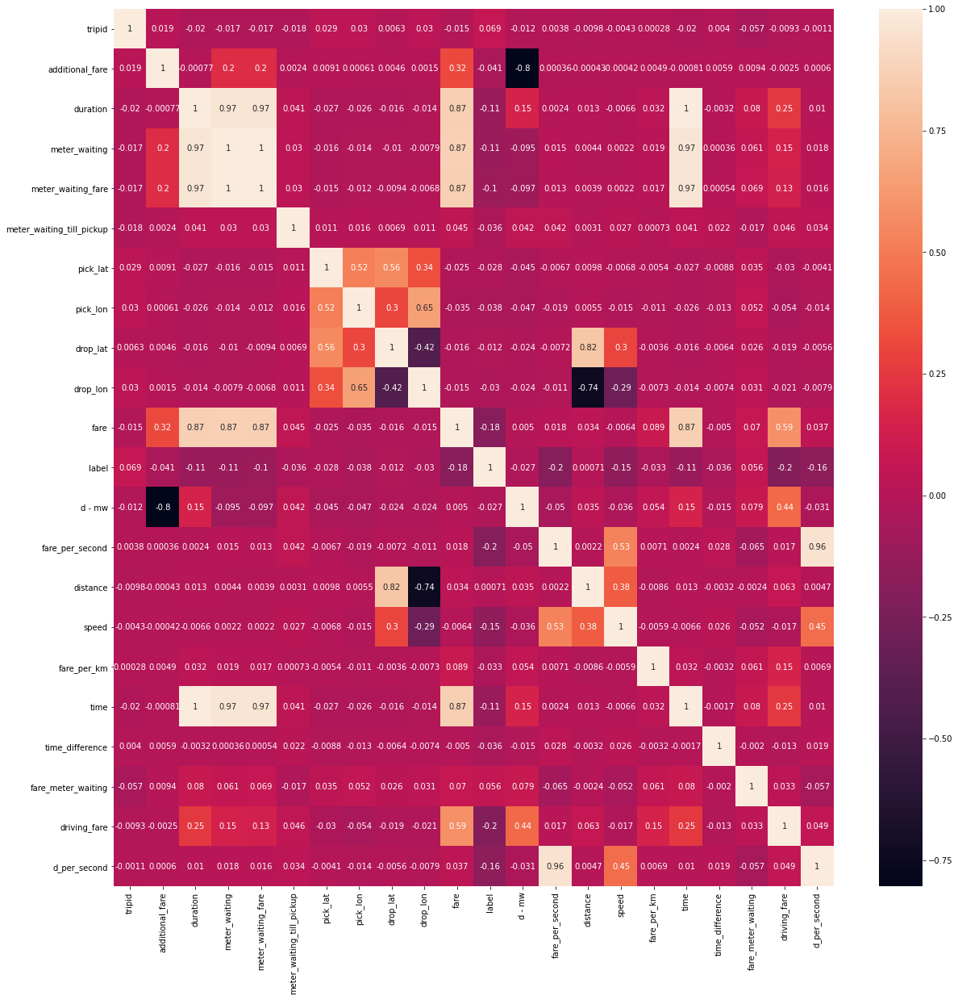

In [ ]:
train_drop_na['label'].replace(['correct', 'incorrect'], value = [1, 0], inplace = True)

fig, ax = plt.subplots(figsize=(20,20))

sns.heatmap(train_drop_na.corr(), annot = True, ax= ax)

In [ ]:
train_drop_na['label'].replace([1, 0], value = ['correct', 'incorrect'], inplace = True)

/usr/local/lib/python3.6/dist-packages/pandas/core/generic.py:6746: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


/usr/local/lib/python3.6/dist-packages/numpy/core/function_base.py:153: RuntimeWarning: invalid value encountered in multiply
  y *= step
/usr/local/lib/python3.6/dist-packages/numpy/linalg/linalg.py:1965: RuntimeWarning: invalid value encountered in greater
  large = s > cutoff
/usr/local/lib/python3.6/dist-packages/numpy/core/function_base.py:153: RuntimeWarning: invalid value encountered in multiply
  y *= step
/usr/local/lib/python3.6/dist-packages/numpy/linalg/linalg.py:1965: RuntimeWarning: invalid value encountered in greater
  large = s > cutoff


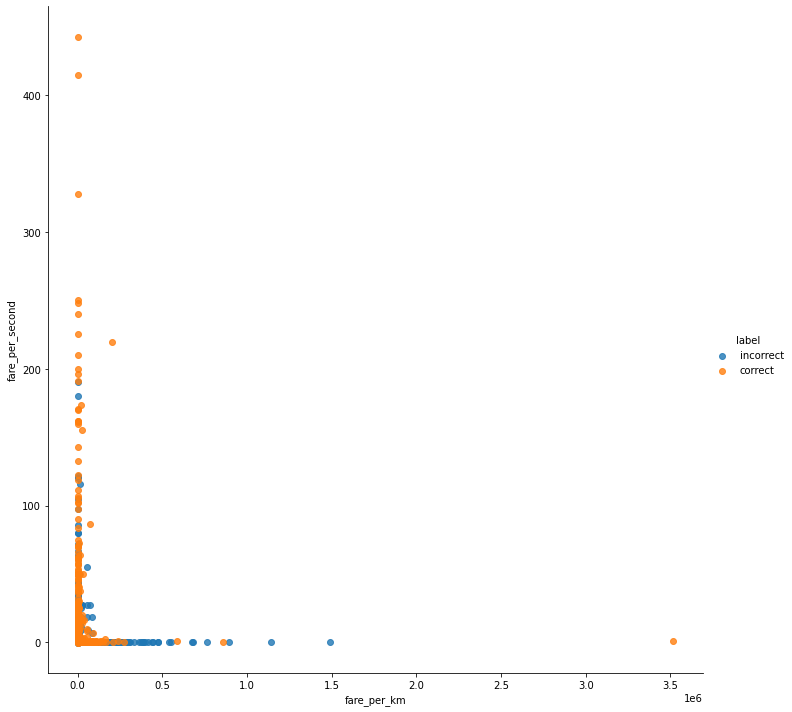

In [ ]:
sns.lmplot(x = 'fare_per_km', y = 'fare_per_second', data = train_drop_na, hue = 'label', height = 10)

/usr/local/lib/python3.6/dist-packages/numpy/core/function_base.py:153: RuntimeWarning: invalid value encountered in multiply
  y *= step
/usr/local/lib/python3.6/dist-packages/numpy/linalg/linalg.py:1965: RuntimeWarning: invalid value encountered in greater
  large = s > cutoff
/usr/local/lib/python3.6/dist-packages/numpy/core/function_base.py:153: RuntimeWarning: invalid value encountered in multiply
  y *= step
/usr/local/lib/python3.6/dist-packages/numpy/linalg/linalg.py:1965: RuntimeWarning: invalid value encountered in greater
  large = s > cutoff


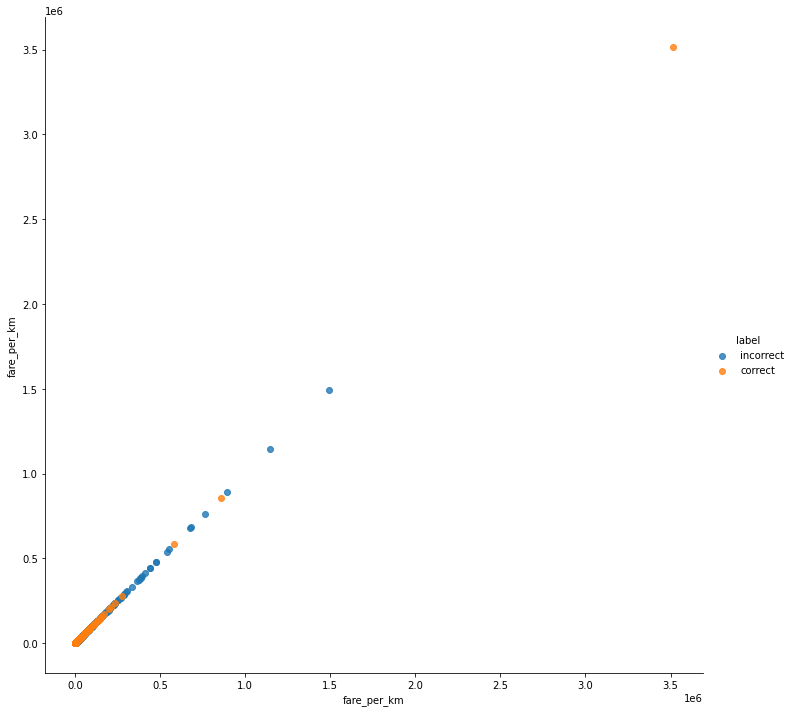

In [ ]:
sns.lmplot(x = 'fare_per_km', y = 'fare_per_km', data = train_drop_na, hue = 'label', height = 10)

In [ ]:
train_drop_na['pickup_time'] = pd.to_datetime(train_drop_na['pickup_time'], format="%m/%d/%Y %H:%M")

train_drop_na['pickup_hour'] = train_drop_na['pickup_time'].dt.hour

train_drop_na['pickup_minute'] = train_drop_na['pickup_time'].dt.minute 

train_drop_na['pickup_month'] = train_drop_na['pickup_time'].dt.month

train_drop_na['pickup_date'] = train_drop_na['pickup_time'].dt.day

In [ ]:
train_drop_na['waiting_fare_per_second'] = train_drop_na['meter_waiting_fare'] / train_drop_na['meter_waiting']

In [ ]:
train_drop_na.head()

,tripid,additional_fare,duration,meter_waiting,meter_waiting_fare,meter_waiting_till_pickup,pickup_time,drop_time,pick_lat,pick_lon,drop_lat,drop_lon,fare,label,d - mw,fare_per_second,distance,speed,fare_per_km,fare_per_km_driving,time,time_difference,pickup_hour,pickup_minute,pickup_month,pickup_date,waiting_fare_per_second
0,189123628,10.5,834.0,56.0,0.0000,64.0,2019-11-01 00:20:00,11/1/2019 0:34,6.86252,79.8993,6.90330,79.8783,270.32,correct,778.0,0.333959,5.092770,23.565516,53.079170,51.017424,840.0,6.0,0,20,11,1,0.0000
1,189125358,10.5,791.0,47.0,0.0000,134.0,2019-11-01 00:56:00,11/1/2019 1:09,6.88589,79.8984,6.91373,79.8923,197.85,correct,744.0,0.251815,3.168058,15.329311,62.451516,59.137183,780.0,11.0,0,56,11,1,0.0000
2,189125719,10.5,1087.0,80.0,0.0000,61.0,2019-11-01 01:08:00,11/1/2019 1:26,6.90839,79.8651,6.93669,79.9146,301.64,correct,1007.0,0.289116,6.305395,22.541631,47.838398,46.173157,1080.0,7.0,1,8,11,1,0.0000
3,189127273,10.5,598.0,271.0,15.6638,68.0,2019-11-01 02:27:00,11/1/2019 2:37,6.92570,79.8895,6.92748,79.8971,82.30,correct,327.0,0.171670,0.861946,9.489315,95.481606,65.127273,600.0,2.0,2,27,11,1,0.0578
5,189129552,10.5,3407.0,182.0,0.0000,112.0,2019-11-01 05:38:00,11/1/2019 6:35,7.13402,79.8969,6.91865,79.8649,1065.02,correct,3225.0,0.326983,24.207039,27.021811,43.996293,43.562535,3420.0,13.0,5,38,11,1,0.0000


In [ ]:
train_drop_na.shape

(16968, 27)

In [ ]:
train_no_time = train_drop_na.drop(['tripid', 'pickup_time', 'drop_time', 'time_difference', 'pick_lat', 'pick_lon', 'drop_lat', 'drop_lon', 'pickup_hour', 'pickup_minute', 'pickup_month', 'pickup_date', 'fare_per_km_driving'], axis=1)
train_no_time['label'].replace(['correct', 'incorrect'], value = [1, 0], inplace = True)

In [ ]:
bins = [-5, 0.01, 0.1, 1, 10, 100, 200, np.inf]
labels = [1,2,3,4,5,6,7]

In [ ]:
train_no_time['binned'] = pd.cut(train_no_time['fare_per_second'], bins=bins, labels=labels)

In [ ]:
train_no_time.head()

,additional_fare,duration,meter_waiting,meter_waiting_fare,meter_waiting_till_pickup,fare,label,d - mw,fare_per_second,distance,speed,fare_per_km,time,waiting_fare_per_second,binned
0,10.5,834.0,56.0,0.0000,64.0,270.32,1,778.0,0.333959,5.092770,23.565516,53.079170,840.0,0.0000,3
1,10.5,791.0,47.0,0.0000,134.0,197.85,1,744.0,0.251815,3.168058,15.329311,62.451516,780.0,0.0000,3
2,10.5,1087.0,80.0,0.0000,61.0,301.64,1,1007.0,0.289116,6.305395,22.541631,47.838398,1080.0,0.0000,3
3,10.5,598.0,271.0,15.6638,68.0,82.30,1,327.0,0.171670,0.861946,9.489315,95.481606,600.0,0.0578,3
5,10.5,3407.0,182.0,0.0000,112.0,1065.02,1,3225.0,0.326983,24.207039,27.021811,43.996293,3420.0,0.0000,3


In [ ]:
train_no_time.shape

(16968, 15)

In [ ]:
import lightgbm as lgb

In [ ]:
clf = lgb.LGBMClassifier(class_weight='balanced',drop_rate=0.9, min_data_in_leaf=100, max_bin=255,
                                 n_estimators=5000,min_sum_hessian_in_leaf=1,importance_type='gain',learning_rate=0.1,bagging_fraction = 0.85,
                                 colsample_bytree = 1.0,feature_fraction = 0.1,lambda_l1 = 5.0,lambda_l2 = 3.0,max_depth =  15,
                                 min_child_samples = 55,min_child_weight = 5.0,min_split_gain = 0.1,num_leaves = 100,subsample = 0.75)

In [ ]:
X = train_no_time.drop(['label'], axis=1)
y = train_no_time['label']

In [ ]:
X.head()

,additional_fare,duration,meter_waiting,meter_waiting_fare,meter_waiting_till_pickup,fare,d - mw,fare_per_second,distance,speed,fare_per_km,fare_per_km_driving,time,waiting_fare_per_second,fare_per_sec_km
0,10.5,834.0,56.0,0.0000,64.0,270.32,778.0,0.333959,5.092770,23.565516,53.079170,51.017424,840.0,0.0000,17.726260
1,10.5,791.0,47.0,0.0000,134.0,197.85,744.0,0.251815,3.168058,15.329311,62.451516,59.137183,780.0,0.0000,15.726198
2,10.5,1087.0,80.0,0.0000,61.0,301.64,1007.0,0.289116,6.305395,22.541631,47.838398,46.173157,1080.0,0.0000,13.830855
3,10.5,598.0,271.0,15.6638,68.0,82.30,327.0,0.171670,0.861946,9.489315,95.481606,65.127273,600.0,0.0578,16.391359
5,10.5,3407.0,182.0,0.0000,112.0,1065.02,3225.0,0.326983,24.207039,27.021811,43.996293,43.562535,3420.0,0.0000,14.386038


In [ ]:
X.shape

(16968, 15)

In [ ]:
from sklearn.model_selection import StratifiedKFold

In [ ]:
from sklearn.model_selection import StratifiedKFold


kf = StratifiedKFold(n_splits=5, shuffle=True)
# partially based on https://www.kaggle.com/c0conuts/xgb-k-folds-fastai-pca
predicts = []
for train_index, test_index in kf.split(X, y):
    print("###")
    X_train, X_val = X.iloc[train_index], X.iloc[test_index]
    y_train, y_val = y.iloc[train_index], y.iloc[test_index]
    clf.fit(X_train, y_train, eval_set=[(X_val, y_val)], 
            early_stopping_rounds=300)

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(clf.feature_importances_,X.columns)), columns=['Value','Feature'])
feature_imp.head()

,Value,Feature
0,558.103547,pickup_hour
1,704.945513,pickup_date
2,717.656708,pickup_minute
3,749.528498,pickup_month
4,1040.577795,drop_lon


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


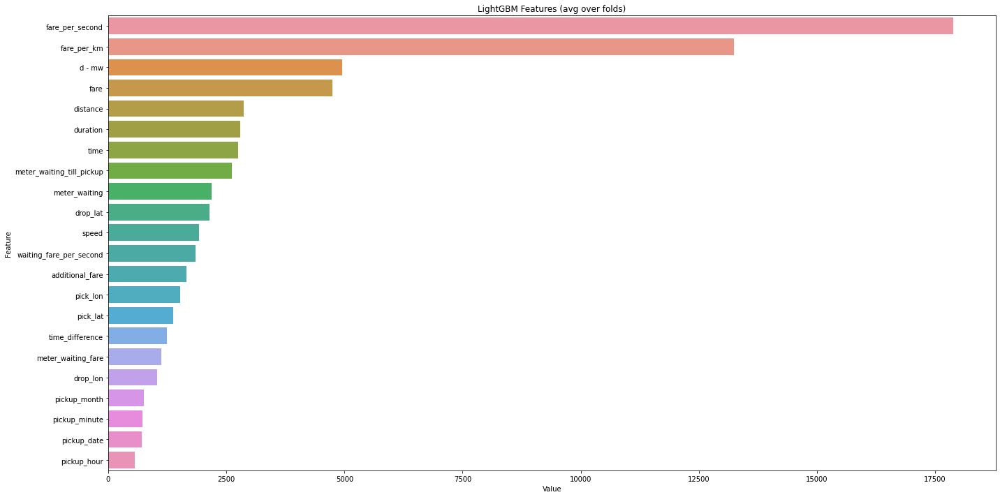

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# sorted(zip(clf.feature_importances_, X.columns), reverse=True)
feature_imp = pd.DataFrame(sorted(zip(clf.feature_importances_,X.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()
plt.show()

In [ ]:
bins = [-5, 0.01, 0.1, 1, 10, 100, 200, np.inf]
labels = [1,2,3,4,5,6,7]

In [ ]:
test = pd.read_csv(path + '/test.csv')


test['d - mw'] = test['duration'] - test['meter_waiting']

test['fare_per_second']  = (test['fare'] - test['additional_fare'] - test['meter_waiting_fare']) / test['d - mw']



from math import sin, cos, sqrt, atan2

R = 6373.0

def haversine(lat1, lon1, lat2, lon2, to_radians=True, earth_radius=6371):
    """
    slightly modified version: of http://stackoverflow.com/a/29546836/2901002

    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees or in radians)

    All (lat, lon) coordinates must have numeric dtypes and be of equal length.

    """
    if to_radians:
        lat1, lon1, lat2, lon2 = np.radians([lat1, lon1, lat2, lon2])

    a = np.sin((lat2-lat1)/2.0)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin((lon2-lon1)/2.0)**2

    return earth_radius * 2 * np.arcsin(np.sqrt(a))


test['distance'] = haversine(test['pick_lat'], test['pick_lon'], test['drop_lat'], test['drop_lon'])

test['speed'] = (test['distance'] / test['d - mw'])  * 3600


test['fare_per_km'] = test['fare'] / test['distance']

#test['fare_per_km_driving'] = (test['fare'] - test['additional_fare'] - test['meter_waiting_fare']) / test['distance']

from datetime import datetime

pd.to_datetime(test['pickup_time'], format="%m/%d/%Y %H:%M")

test['time'] = pd.to_datetime(test['drop_time'], format="%m/%d/%Y %H:%M") - pd.to_datetime(test['pickup_time'], format="%m/%d/%Y %H:%M")

test['time'] = test['time'].dt.total_seconds()

test['time_difference'] = np.abs(test['time'] - test['duration'])



In [ ]:
test['pickup_time'] = pd.to_datetime(test['pickup_time'], format="%m/%d/%Y %H:%M")

test['pickup_hour'] = test['pickup_time'].dt.hour

test['pickup_minute'] = test['pickup_time'].dt.minute 

test['pickup_month'] = test['pickup_time'].dt.month

test['pickup_date'] = test['pickup_time'].dt.day

test['waiting_fare_per_second'] = test['meter_waiting_fare'] / test['meter_waiting']

test['binned'] = pd.cut(test['fare_per_second'], bins=bins, labels=labels)

test['binned'] = test['binned'].astype(str)

bins = test['binned'].unique()
for each in bins:
  test[f'{each}bins'] = test['binned'].apply(lambda x: 1 if x == each else 0)
test = test.drop(['binned'],axis=1)

#test['binned'].replace(['3.0', '5.0', '2.0', '4.0', '1.0', '6.0', '7.0', 'nan'], value = [3, 5, 2, 4, 1, 6, 7, 8], inplace = True)
#new column
#test['fare_per_km_driving'] = (test['fare'] - test['additional_fare'] - test['meter_waiting_fare']) / test['distance']

#test['fare_per_sec_km'] = test['fare_per_second'] * test['fare_per_km']


test = test.drop(['tripid', 'pickup_time', 'drop_time', 'time_difference', 'pick_lat', 'pick_lon', 'drop_lat', 'drop_lon', 'pickup_hour', 'pickup_minute', 'pickup_month', 'pickup_date'], axis=1)

In [ ]:
submission = pd.read_csv(path + '/sample_submission.csv')
submission.head()

,tripid,prediction
0,213284604,1
1,213286352,0
2,213293973,0
3,213294622,1
4,213298687,1


In [ ]:
pred = clf.predict(test)
pred

array([1, 0, 0, ..., 1, 0, 0])

In [ ]:
output = pd.DataFrame({'tripid': submission.tripid, 'prediction': pred})

In [ ]:
output.loc[output['prediction'] == 0]

,tripid,prediction
1,213286352,0
2,213293973,0
5,213299545,0
9,213305134,0
13,213310068,0
...,...,...
8555,222831987,0
8562,222837360,0
8565,222850789,0
8574,222858691,0


In [ ]:
X['binned'] = X['binned'].astype(str)

In [ ]:
X.loc[X['nanbins'] == 0.0]

In [ ]:
#X['binned'].replace(['3.0', '5.0', '2.0', '4.0', '1.0', '6.0', '7.0', 'nan'], value = [3, 5, 2, 4, 1, 6, 7, 8], inplace = True)

In [ ]:
bins = X['binned'].unique()
for each in bins:
  X[f'{each}bins'] = X['binned'].apply(lambda x: 1 if x == each else 0)
X = X.drop(['binned'],axis=1)

In [ ]:
X = X.drop(['nanbins'], axis=1)

In [ ]:
import xgboost

In [ ]:
model = xgboost.XGBClassifier(base_score=0.5, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='auc',
              gamma=0.4, gpu_id=0, importance_type='gain', learning_rate=0.01,
              max_delta_step=0, max_depth=12, min_child_weight=7, n_estimators=5000, n_jobs=6, nthread=6,
              num_parallel_tree=1, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, silent=True,
              subsample=0.8, validate_parameters=False)

In [ ]:
kf = StratifiedKFold(n_splits=5, shuffle=True)
# partially based on https://www.kaggle.com/c0conuts/xgb-k-folds-fastai-pca
predicts = []
for train_index, test_index in kf.split(X, y):
    print("###")
    X_train, X_val = X.iloc[train_index], X.iloc[test_index]
    y_train, y_val = y.iloc[train_index], y.iloc[test_index]
    eval_set = [(X_val, y_val)]
    model.fit(X_train, y_train , early_stopping_rounds=300, eval_set = eval_set)

In [ ]:
model.get_booster().get_score(importance_type="total_gain")

In [ ]:
feature_imp_xgb = pd.DataFrame(model.get_booster().get_score(importance_type="total_gain").items(), columns=['Feature','Value'])

In [ ]:
feature_imp_xgb

,Feature,Value
0,fare_per_second,94488.040364
1,speed,16008.212737
2,meter_waiting_fare,4175.949766
3,fare_per_km,22273.386134
4,d - mw,6479.197482
5,duration,11849.969470
6,additional_fare,5638.558432
7,time,1577.291943
8,fare,31380.867217
9,meter_waiting,8439.841295


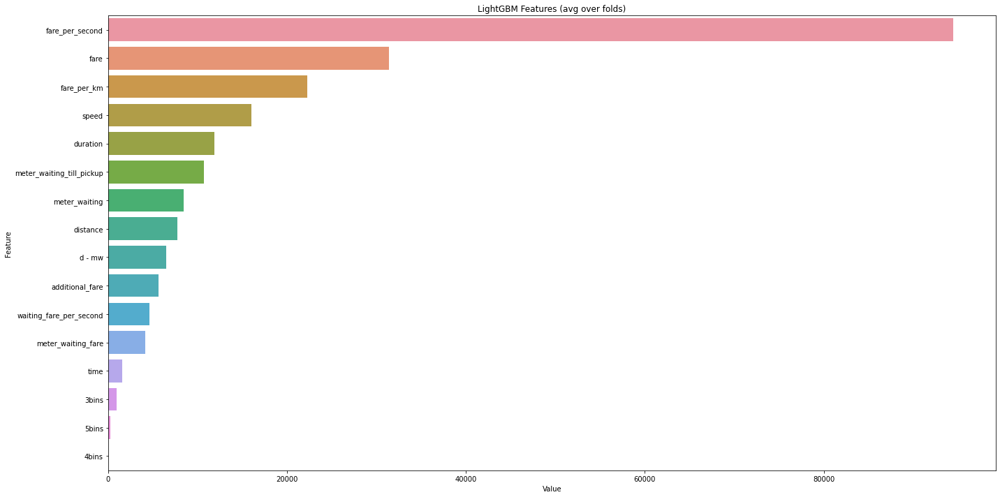

In [ ]:
plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp_xgb.sort_values(by="Value", ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()
plt.show()

In [ ]:
test.shape

(8576, 20)

In [ ]:
X.shape

(16968, 21)

In [ ]:
test.loc[test['fare_per_second'] < 0.01]

,additional_fare,duration,meter_waiting,meter_waiting_fare,meter_waiting_till_pickup,fare,d - mw,fare_per_second,distance,speed,fare_per_km,time,waiting_fare_per_second,3.0bins,4.0bins,5.0bins,7.0bins,6.0bins,2.0bins,nanbins
3519,0.0,1934,115,0.0000,353,0.00,1819,0.00000,5.983577,11.842154,0.000000,1920.0,0.000000,0,0,0,0,0,0,1
8273,30.5,3062,1676,75.6602,38,105.98,1386,-0.00013,7.481612,19.432759,14.165396,3120.0,0.045143,0,0,0,0,0,0,1


In [ ]:
X.head()

,additional_fare,duration,meter_waiting,meter_waiting_fare,meter_waiting_till_pickup,fare,d - mw,fare_per_second,distance,speed,fare_per_km,time,waiting_fare_per_second,3.0bins,5.0bins,2.0bins,4.0bins,1.0bins,6.0bins,7.0bins,nanbins
0,10.5,834.0,56.0,0.0000,64.0,270.32,778.0,0.333959,5.092770,23.565516,53.079170,840.0,0.0000,1,0,0,0,0,0,0,0
1,10.5,791.0,47.0,0.0000,134.0,197.85,744.0,0.251815,3.168058,15.329311,62.451516,780.0,0.0000,1,0,0,0,0,0,0,0
2,10.5,1087.0,80.0,0.0000,61.0,301.64,1007.0,0.289116,6.305395,22.541631,47.838398,1080.0,0.0000,1,0,0,0,0,0,0,0
3,10.5,598.0,271.0,15.6638,68.0,82.30,327.0,0.171670,0.861946,9.489315,95.481606,600.0,0.0578,1,0,0,0,0,0,0,0
5,10.5,3407.0,182.0,0.0000,112.0,1065.02,3225.0,0.326983,24.207039,27.021811,43.996293,3420.0,0.0000,1,0,0,0,0,0,0,0


In [ ]:
pred = model.predict(test)

In [ ]:
output = pd.DataFrame({'tripid': submission.tripid, 'prediction': pred})
output.loc[output['prediction'] == 0]

,tripid,prediction
5,213299545,0
13,213310068,0
30,213318535,0
39,213325248,0
40,213326731,0
...,...,...
8401,222716573,0
8406,222717033,0
8443,222735934,0
8532,222816520,0


In [ ]:
output.to_csv(path + '/submission_27.csv', index=False)

In [ ]:
s = pd.read_csv(path + '/submission_12.csv')

In [ ]:
output.loc[output['prediction'] != s['prediction']]

,tripid,prediction
89,213352944,0
189,213454321,1
203,213465226,1
229,213488882,1
347,213586567,1
...,...,...
7339,221451212,1
7482,221629414,0
7584,221753950,0
7878,222179555,1


In [ ]:
!pip install pdpbox

     |████████████████████████████████| 57.7MB 70kB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.0-cp36-none-any.whl size=57690722 sha256=4c86577e5280f1536c3d5f8c6da1b03dffdf5602d79747221b9dc693419c8805
  Stored in directory: /root/.cache/pip/wheels/7d/08/51/63fd122b04a2c87d780464eeffb94867c75bd96a64d500a3fe
Successfully built pdpbox


In [ ]:
from pdpbox import pdp, get_dataset, info_plots

In [ ]:
no_nan = X.replace([np.inf, -np.inf], np.nan)
no_nan = no_nan.dropna()

In [ ]:
feature_names = [i for i in no_nan.columns]

pdp_goals = pdp.pdp_isolate(model=model, dataset= no_nan, model_features=feature_names, feature='fare_per_second')

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


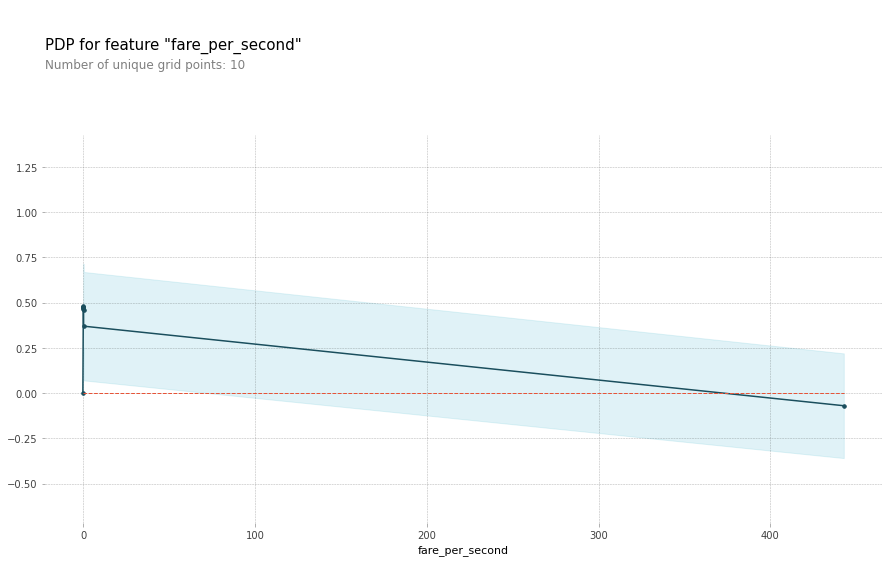

In [ ]:
pdp.pdp_plot(pdp_goals, 'fare_per_second')
plt.show()

In [ ]:
features_to_plot = ['fare_per_second', 'fare']

inter1 = pdp.pdp_interact(
    model=model, dataset=no_nan, model_features=feature_names, features=features_to_plot
)

TypeError: ignored

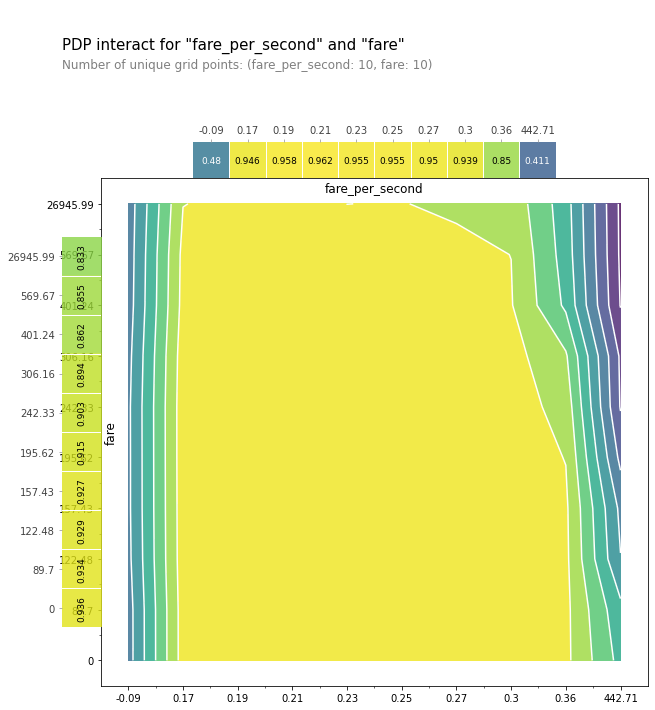

In [ ]:
fig, axes = pdp.pdp_interact_plot(
    pdp_interact_out=inter1, feature_names=features_to_plot, plot_type='contour', x_quantile=True, plot_pdp=True
)